In [1]:
import torch
import numpy as np
import networkx as nx
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, remove_self_loops, degree, from_networkx
from tqdm import tqdm
import random
import copy
from consensus_algorithms import NakamotoConsensus

# Sample Scale Free Network

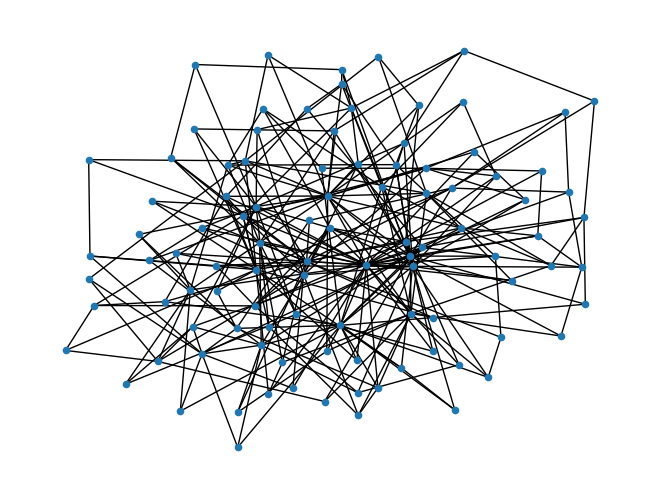

In [3]:
G = nx.barabasi_albert_graph(n=100, m=3)
nx.draw(G, node_size=20)

In [4]:
data = from_networkx(G)
edge_index = data.edge_index

In [5]:
len(G.nodes)

100

In [6]:
num_nodes = len(G.nodes)
x = torch.zeros((num_nodes, 2))
x[:, 1] = 0
hash_power = torch.tensor(np.random.dirichlet(np.ones(num_nodes)), dtype=torch.float32)

# Simulation

In [7]:
model = NakamotoConsensus(num_timesteps=50)
final_state, state_over_time = model(x, edge_index, hash_power)

In [8]:
print("Final Heights:", final_state[:, 0])
print("Final Tip IDs:", final_state[:, 1])

# Forks detected in last round
print("Forks Detected at Nodes:", model.forks.tolist())

Final Heights: tensor([18., 18., 18., 18., 18., 18., 18., 18., 18., 18., 18., 18., 18., 18.,
        18., 18., 18., 18., 18., 18., 17., 18., 18., 18., 18., 18., 18., 18.,
        18., 18., 17., 18., 17., 17., 18., 17., 18., 17., 18., 18., 18., 18.,
        18., 18., 18., 18., 18., 18., 17., 18., 18., 18., 18., 18., 18., 18.,
        18., 18., 18., 18., 17., 18., 18., 18., 18., 17., 18., 18., 17., 17.,
        18., 17., 18., 18., 18., 17., 18., 18., 17., 17., 17., 17., 18., 18.,
        17., 18., 18., 18., 17., 18., 18., 18., 18., 18., 18., 18., 18., 18.,
        18., 17.])
Final Tip IDs: tensor([53., 53., 52., 53., 54., 52., 52., 52., 52., 53., 53., 53., 53., 53.,
        52., 52., 52., 52., 55., 53., 50., 52., 53., 52., 52., 53., 54., 52.,
        53., 52., 49., 53., 49., 49., 52., 48., 53., 49., 54., 52., 53., 52.,
        52., 53., 54., 53., 53., 52., 48., 53., 52., 55., 52., 52., 53., 53.,
        53., 52., 52., 54., 49., 53., 53., 52., 52., 49., 53., 52., 48., 49.,
        52., 49

# Visualization / Animation

Numbers represent blockchain length and colors represent fork

In [105]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [106]:
def animate_consensus_evolution(consensus_over_time, interval=500):
    """
    Visualizes the evolution of chain height and tip ID over time.
    - consensus_over_time: list of tensors of shape [num_nodes, 2]
    - interval: delay between frames in milliseconds
    """
    num_steps = len(consensus_over_time)
    num_nodes = consensus_over_time[0].size(0)

    # Get all unique tip IDs for consistent coloring
    all_tips = torch.cat([state[:, 1] for state in consensus_over_time])
    unique_tips = torch.unique(all_tips).tolist()
    tip_to_color = {tip_id: plt.cm.tab20(i % 20) for i, tip_id in enumerate(unique_tips)}

    fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.bar(range(num_nodes), consensus_over_time[0][:, 0].tolist(), color='gray')

    def update(frame):
        ax.clear()
        current_state = consensus_over_time[frame]
        heights = current_state[:, 0].tolist()
        tips = current_state[:, 1].tolist()

        colors = [tip_to_color[tip] for tip in tips]
        ax.bar(range(num_nodes), heights, color=colors)
        ax.set_ylim(0, max([s[:,0].max().item() for s in consensus_over_time]) + 1)
        ax.set_title(f"Timestep {frame}")
        ax.set_xlabel("Node")
        ax.set_ylabel("Chain Height")

    ani = animation.FuncAnimation(fig, update, frames=num_steps, interval=interval, repeat=False)
    plt.close(fig)
    return HTML(ani.to_jshtml())

In [100]:
animate_consensus_evolution(state_over_time)

In [111]:
def animate_consensus_networkx(consensus_over_time, edge_index, interval=500, save_to_file=False, filename='graph_animation'):
    """
    Visualizes consensus evolution using NetworkX graphs.
    
    Parameters:
    - consensus_over_time: list of tensors [num_nodes, 2]
    - edge_index: torch.LongTensor of shape [2, num_edges]
    - interval: animation frame interval (ms)
    """
    num_steps = len(consensus_over_time)
    num_nodes = consensus_over_time[0].size(0)

    # 1. Build NetworkX graph from edge_index
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    edges = edge_index.t().tolist()
    G.add_edges_from(edges)

    # 2. Assign fixed layout
    pos = nx.spring_layout(G, seed=42)  # or kamada_kawai_layout / circular_layout

    # 3. Tip ID color map
    all_tips = torch.cat([state[:, 1] for state in consensus_over_time])
    unique_tips = torch.unique(all_tips).tolist()
    tip_to_color = {tip_id: plt.cm.tab20(i % 20) for i, tip_id in enumerate(unique_tips)}

    # 4. Initialize figure
    fig, ax = plt.subplots(figsize=(7, 5))

    def update(frame):
        ax.clear()
        state = consensus_over_time[frame]
        heights = state[:, 0].tolist()
        tips = state[:, 1].tolist()
        node_colors = [tip_to_color[tip] for tip in tips]
        labels = {i: f"{int(heights[i])}" for i in range(num_nodes)}

        nx.draw(
            G, pos, ax=ax,
            node_color=node_colors,
            with_labels=True,
            labels=labels,
            node_size=300,
            font_size=8,
            font_color="white",
            edge_color="gray"
        )
        ax.set_title(f"Timestep {frame}")
        ax.axis("off")

    ani = animation.FuncAnimation(fig, update, frames=num_steps, interval=interval, repeat=False)
    if save_to_file:
        ani.save(f'{filename}.gif', writer='pillow', fps=2)
    plt.close(fig)
    return HTML(ani.to_jshtml())

In [112]:
animate_consensus_networkx(state_over_time, edge_index, save_to_file=True, filename='slowed_graph_anim')